In [22]:
from daam import trace, set_seed
from diffusers import StableDiffusionPipeline
from models.diffuserpipeline import StableDiffusionPipelineForNegativePrompts
import torch
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def exp(prompt, negative_prompt, seed, steps, words, time_id, save_dir=None):
    type = "negative" if 'n:' in words else "positive"
    time_id = [list(range(time_id_[0], time_id_[1] + 1)) for time_id_ in time_id]
    model_id = 'stabilityai/stable-diffusion-2-base'
    device = 'cuda'
    pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True)
    pipe = pipe.to(device)

    fig, axs = plt.subplots(1, len(time_id)+1, figsize=(5*(len(time_id)+1), 5))
    for ax in axs:
        ax.axis('off')
    fig.tight_layout()
    with torch.cuda.amp.autocast(dtype=torch.float16), torch.no_grad():
        with trace(pipe) as tc:
            out = pipe(prompt, negative_prompt=negative_prompt, num_inference_steps=steps, generator=set_seed(seed))
            image = out.images[0]
            axs[0].imshow(image)
            # image.save('output.png')
            for i, time_i in enumerate(time_id):
                heat_map = tc.compute_global_heat_map(time_idx=time_i)
                heat_map_word = heat_map.compute_word_heat_map(words)
                # convert 2D tensor heat_map_word.heatmap to PIL.Image
                heat_map_word.plot_overlay(out.images[0], ax=axs[i+1])
                
                # plt.imshow(heat_map.squeeze().cpu().numpy(), cmap='jet')
                # plt.savefig(f'when/{negative_prompt}/{type}/seed_heatmap_{i}.png')
                # image = plt.cm.jet(image)
                # image = Image.fromarray((image[:, :, :3] * 255).astype(np.uint8))
                # image.save(f'when/{negative_prompt}/{type}/seed_heatmap_{i}.png')
    if save_dir:
        plt.savefig(save_dir)
         

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.02it/s]


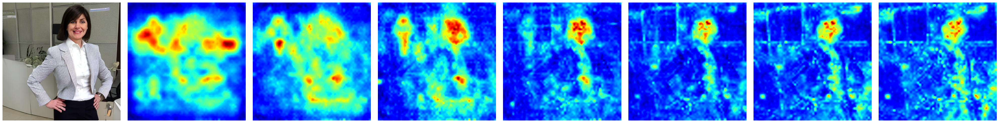

In [33]:
prompt = "professional office woman"
negative_prompt = "glasses"
seed = 8577767
steps = 30
words = "n:glasses"
save_dir = f'when/glasses_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id, save_dir=save_dir)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 12.18it/s]

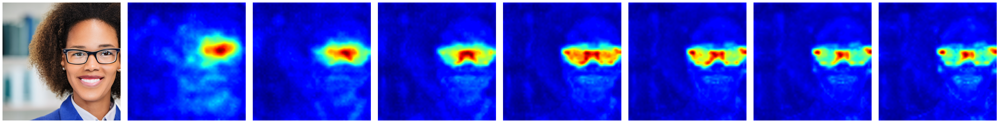

In [45]:
prompt = "professional office woman wearing glasses"
seed = 8577767
steps = 30
words = "glasses"
save_dir = f'when/glasses_pos_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id, save_dir=save_dir)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


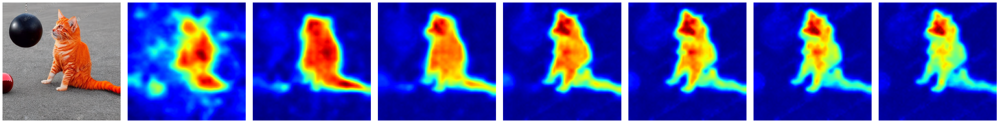

In [43]:
prompt = "a red cat and a black ball"
negative_prompt = "black cat"
seed = 679216
steps = 30
words = "cat"
save_dir = f'when/cat_pos_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id,save_dir=save_dir)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 12.05it/s]


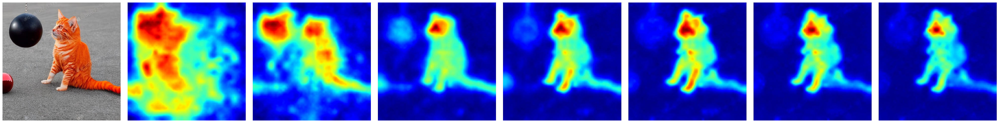

In [44]:
prompt = "a red cat and a black ball"
negative_prompt = "black cat"
seed = 679216
steps = 30
words = "n:cat"
save_dir = f'when/cat_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id,save_dir=save_dir)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.11it/s]


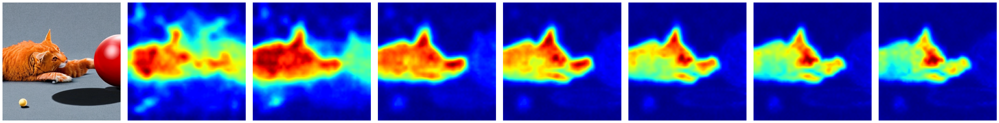

In [27]:
prompt = "a red cat and a black ball"
negative_prompt = "black cat"
seed = 815
steps = 30
words = "cat"
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 13.46it/s]


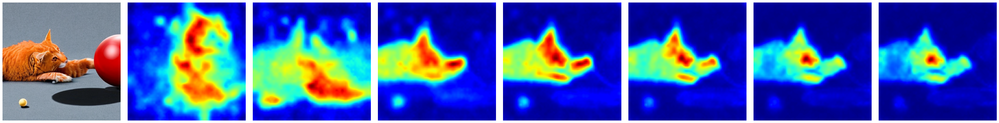

In [28]:
prompt = "a red cat and a black ball"
negative_prompt = "black cat"
seed = 815
steps = 30
words = "n:cat"
save_dir = f'when/{negative_prompt}/negative/seed_heatmap.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.44it/s]


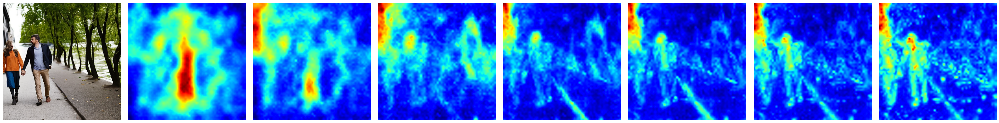

In [48]:
prompt = "a couple walking along the riverside in Paris"
negative_prompt = "The Eiffel Tower"
seed = 4343903
steps = 30
words = "n:The Eiffel Tower"
save_dir = f'when/tower_neg_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id,)

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 11.66it/s]


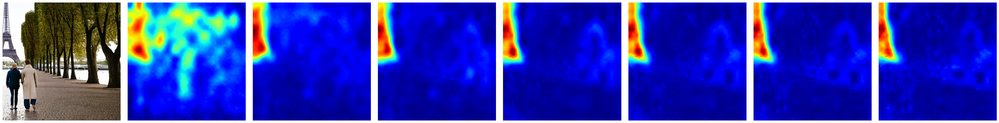

In [49]:
prompt = "a couple walking along the riverside in Paris with the Eiffel Tower"
negative_prompt = None
seed = 4343903
steps = 30
words = "the Eiffel Tower"
save_dir = f'when/tower_pos_{seed}.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id,save_dir=save_dir)

In [1]:
prompt = "a couple walking along the riverside in Paris"
negative_prompt = "The Eiffel Tower"
seed = 7995971
steps = 30
words = "n:The Eiffel Tower"
save_dir = f'when/{negative_prompt}/negative/seed_heatmap.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id)

NameError: name 'exp' is not defined

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 15.04it/s]


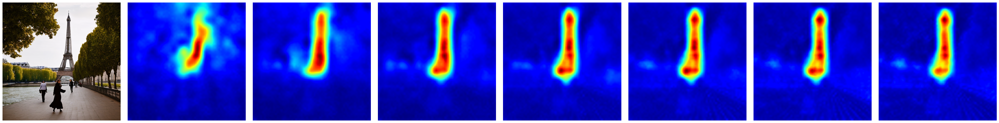

In [32]:
prompt = "a couple walking along the riverside in Paris with the Eiffel Tower"
negative_prompt = None
seed = 7995971
steps = 30
words = "the Eiffel Tower"
save_dir = f'when/{negative_prompt}/negative/seed_heatmap.png'
# time_id = [[0,2],[3,5],[6,8],[9,11],[12,14],[15,17],[18,20],[21,23],[24,26],[27,29]]
#time_id = [[0,4],[5,9],[10,14],[15,19],[20,24],[25,29]]
time_id = [[0,3],[4,7],[8,11],[12,15],[16,19],[20,23],[24,27]]
exp(prompt, negative_prompt, seed, steps, words, time_id)